# Aircraft Detection with YOLOv8

## Introduction

This notebook details the process of training a [YOLOv8](https://www.ultralytics.com/blog/ultralytics-yolov8-turns-one-a-year-of-breakthroughs-and-innovations) model specifically for detecting aircraft within the [Airbus Aircraft Sample Dataset](https://www.kaggle.com/datasets/airbusgeo/airbus-aircrafts-sample-dataset). Utilizing the [Ultralytics](https://docs.ultralytics.com/) implementation of YOLOv8, it presents an end-to-end workflow that encompasses dataset preparation, model training, evaluation, and visualization of detection outcomes. The objective is to craft a robust object detection model that excels in accurately identifying and localizing aircraft, thereby offering comprehensive insights into leveraging YOLOv8 for the analysis of high-resolution aerial imagery.

## Table of Contents

1. **Setup**
    - Import Libraries
    - Configure Environment
2. **Data Preparation**
    - Load and Prepare Dataset
    - Split Dataset into Training and Validation Sets
    - Tiling Large Images for Training
        - Tiling Strategy Overview
        - Tiling Images
        - Adjusting Annotations for Tiles
    - Display Images with Bounding Boxes
        - Here, a visual inspection of images with their corresponding bounding boxes is conducted to verify the preprocessing accuracy.
3. **Model Selection and Setup**
    - Overview of YOLOv8
    - Load Pre-Trained Model
    - Set Dataset Configuration
4. **Model Training**
    - Define Training Parameters
    - Train the Model
5. **Model Evaluatation**
    - Evaluate Model Performance
    - Evaluatation Results
6. **Results Visualization**
    - Visualization of Detection Results
    - Additional Visualizations
6. **Conclusion**
    - Summary of Findings
    - Recommendations for Model Improvement

## 1. Setup

### 1.1. Import Libraries

In [1]:
from ultralytics import YOLO
import os
from pathlib import Path
import cv2
import random
import opendatasets as od
import numpy as np
import pandas as pd
import shutil
from sklearn.model_selection import train_test_split
import torch
from IPython.display import display, Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

In [2]:
# import ultralytics
# ultralytics.checks()

### 1.2. Configure Environment

In [3]:
parent_dir = Path(os.path.realpath("")).parent

In [4]:
dataset_dir = parent_dir / "data"
raw_data_dir = dataset_dir / "raw"
processed_data_dir = dataset_dir / "processed"

dataset_dir.mkdir(parents=True, exist_ok=True)
raw_data_dir.mkdir(parents=True, exist_ok=True)
processed_data_dir.mkdir(parents=True, exist_ok=True)

In [5]:
dataset_url = "https://www.kaggle.com/datasets/airbusgeo/airbus-aircrafts-sample-dataset"
# od.download(dataset_url, raw_data_dir)

In [6]:
raw_data_file_path = raw_data_dir / "airbus-aircrafts-sample-dataset"
processed_data_file_path = processed_data_dir / "data.csv"

In [7]:
os.listdir(raw_data_file_path)

['annotations.csv', 'extras', 'images', 'LICENSE.txt', 'README.md']

In [8]:
raw_images_dir = raw_data_file_path / "images"
raw_extras_dir = raw_data_file_path / "extras"
df_dir = raw_data_file_path / "annotations.csv"

In [9]:
raw_images_list = list(raw_images_dir.glob('*.jpg'))
raw_extras_list = list(raw_extras_dir.glob('*.jpg'))

In [10]:
train_dir = processed_data_dir / "train"
val_dir = processed_data_dir / "val"
extras_dir = processed_data_dir / "extras"

# Paths for training and validation splits
train_images_dir = train_dir / "images"
val_images_dir = val_dir / "images"
extras_images_dir = extras_dir / "images"
train_labels_dir = train_dir / "labels"
val_labels_dir = val_dir / "labels"

train_images_dir.mkdir(parents=True, exist_ok=True)
val_images_dir.mkdir(parents=True, exist_ok=True)
extras_images_dir.mkdir(parents=True, exist_ok=True)
train_labels_dir.mkdir(parents=True, exist_ok=True)
val_labels_dir.mkdir(parents=True, exist_ok=True)

## 2. Data Preparation

### 2.1. Load and Prepare Dataset

This section details the process of loading the dataset into the working environment and preparing it for the deep learning pipeline.

In [11]:
# Read preprocessed annotations
df = pd.read_csv(processed_data_file_path)

In [12]:
df.head()

,id,image_id,geometry,class,x_min,y_min,x_max,y_max,bbox_width,bbox_height,bbox_area,class_encoded
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane,135,522,245,600,110,78,8580,0
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane,1025,284,1125,384,100,100,10000,0
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane,1058,1503,1130,1568,72,65,4680,0
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane,813,1518,885,1604,72,86,6192,0
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane,594,938,657,1012,63,74,4662,0


In [13]:
df.columns

Index(['id', 'image_id', 'geometry', 'class', 'x_min', 'y_min', 'x_max',
       'y_max', 'bbox_width', 'bbox_height', 'bbox_area', 'class_encoded'],
      dtype='object')

### 2.2. Split Dataset into Training and Validation Sets

This section outlines the division of the dataset into training and validation subsets, a crucial step for evaluating model performance.

In [14]:
unique_image_ids = df['image_id'].unique()

In [15]:
train_ids, val_ids = train_test_split(unique_image_ids, test_size=0.2, random_state=42)

In [16]:
train_df = df[df['image_id'].isin(train_ids)]
val_df = df[df['image_id'].isin(val_ids)]

print(f"Training images: {len(train_df['image_id'].unique())}")
print(f"Validation images: {len(val_df['image_id'].unique())}")

Training images: 82
Validation images: 21


### 2.3. Tiling Large Images for Training

#### Tiling Strategy Overview

Tiling large images involves dividing each image into smaller, fixed-size tiles, often with some overlap between them to ensure no object is split at the edges. This approach has several benefits:

- Reduces Memory Consumption: Smaller tiles fit better into memory, making training more feasible on standard hardware.
- Improves Object Detection: By focusing on smaller sections of the image, the model can detect smaller objects more effectively.
- Increases Data Augmentation: Overlapping tiles can act as additional data, helping improve the model's robustness.

#### Tiling Images

Here, the practical steps to segment each image into tiles are executed.

In [17]:
random_image_name = random.choice(df['image_id'].unique())
random_image_path = os.path.join(raw_images_dir, random_image_name)
random_image_name

'babb0ef2-ef2d-4cab-b3e2-230ae2418cdc.jpg'

In [18]:
image = cv2.imread(random_image_path)
image_height, image_width, _ = image.shape

print(f"Image shape: {image_height}x{image_width}")

Image shape: 2560x2560


In [19]:
def image_to_tiles(df, images_dir, output_dir, tile_size, overlap):
    
    for image_name in df['image_id'].unique():
        image = cv2.imread(images_dir / image_name)
        image_height, image_width, _ = image.shape
        
        # Calculate the number of tiles in each dimension
        x_tiles = int(np.ceil((image_width - overlap) / (tile_size - overlap)))
        y_tiles = int(np.ceil((image_height - overlap) / (tile_size - overlap)))
        
        # Create tiles
        for x in range(x_tiles):
            for y in range(y_tiles):
                # Calculate the coordinates of the tile
                left = x * (tile_size - overlap)
                top = y * (tile_size - overlap)
                right = min(left + tile_size, image_width)
                bottom = min(top + tile_size, image_height)
                
                # Crop the tile from the original image
                tile = image[top:bottom, left:right]
                
                # Save the tile to the output directory
                tile_path = os.path.join(output_dir, f"{image_name[:-4]}_tile_{x}_{y}.jpg")
                cv2.imwrite(tile_path, tile)

In [20]:
tile_size = 512
overlap = 64

In [21]:
x_tiles = int(np.ceil((image_width - overlap) / (tile_size - overlap)))
y_tiles = int(np.ceil((image_height - overlap) / (tile_size - overlap)))

In [22]:
image_to_tiles(train_df, raw_images_dir, train_images_dir, tile_size, overlap)
image_to_tiles(val_df, raw_images_dir, val_images_dir, tile_size, overlap)

#### Adjusting Annotations for Tiles

This section ensures that annotations for objects within each tile accurately reflect their labels and positions.

In [23]:
def labels_for_tiles(df, tiles_output_dir, labels_dir, tile_size, overlap, full_threshold=0.5, minimum_visibility=0.2):

    for image_id in df['image_id'].unique():
        image_path = os.path.join(raw_images_dir, image_id)
        image = cv2.imread(image_path)
        image_height, image_width, _ = image.shape

        # Calculate the number of tiles in each dimension
        x_tiles = int(np.ceil((image_width - overlap) / (tile_size - overlap)))
        y_tiles = int(np.ceil((image_height - overlap) / (tile_size - overlap)))

        # Filter rows for the current image
        image_rows = df[df['image_id'] == image_id]

        for x in range(x_tiles):
            for y in range(y_tiles):
                # Calculate the coordinates of the tile
                x_start = x * (tile_size - overlap)
                y_start = y * (tile_size - overlap)
                x_end = min(x_start + tile_size, image_width)
                y_end = min(y_start + tile_size, image_height)

                # Open a new label file for the tile
                tile_label_path = os.path.join(labels_dir, f"{image_id[:-4]}_tile_{x}_{y}.txt")
                
                with open(tile_label_path, 'w') as label_file:
                    for _, row in image_rows.iterrows():
                        # Check if the bounding box is within the tile
                        if row['x_min'] < x_end and row['x_max'] > x_start and row['y_min'] < y_end and row['y_max'] > y_start:
                            # Adjust the bounding box coordinates relative to the tile
                            x_min_adj = max(row['x_min'] - x_start, 0)
                            y_min_adj = max(row['y_min'] - y_start, 0)
                            x_max_adj = min(row['x_max'] - x_start, tile_size)
                            y_max_adj = min(row['y_max'] - y_start, tile_size)

                            # Calculate visibility ratio
                            visible_area = (x_max_adj - x_min_adj) * (y_max_adj - y_min_adj)
                            total_area = (row['x_max'] - row['x_min']) * (row['y_max'] - row['y_min'])
                            visibility_ratio = visible_area / total_area

                            # Adjust class label based on visibility ratio
                            if visibility_ratio >= full_threshold:
                                class_label = row['class_encoded']  # Full airplane
                            elif visibility_ratio >= minimum_visibility:
                                class_label = 1  # Truncated airplane
                            else:
                                continue  # Skip labeling if visibility is too low

                            # Calculate normalized x_center, y_center, width, and height
                            x_center = (x_min_adj + x_max_adj) / 2 / tile_size
                            y_center = (y_min_adj + y_max_adj) / 2 / tile_size
                            width = (x_max_adj - x_min_adj) / tile_size
                            height = (y_max_adj - y_min_adj) / tile_size

                            # Write the adjusted annotation in YOLO format
                            label_content = f"{class_label} {x_center} {y_center} {width} {height}\n"
                            label_file.write(label_content)

In [24]:
labels_for_tiles(train_df, train_images_dir, train_labels_dir, tile_size, overlap)
labels_for_tiles(val_df, val_images_dir, val_labels_dir, tile_size, overlap)

### 2.4. Display Images with Bounding Boxes

Here, a visual inspection of images with their corresponding bounding boxes is conducted to verify the preprocessing accuracy.

#### Display Images with Bounding Boxes using DataFrame

In [25]:
image_df = df[df['image_id'] == random_image_name]

In [26]:
for _, row in image_df.iterrows():
    # Calculate normalized bounding box coordinates
    x_min, y_min, x_max, y_max = row['x_min'], row['y_min'], row['x_max'], row['y_max']
    cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

In [27]:
# Convert BGR to RGB for displaying in matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

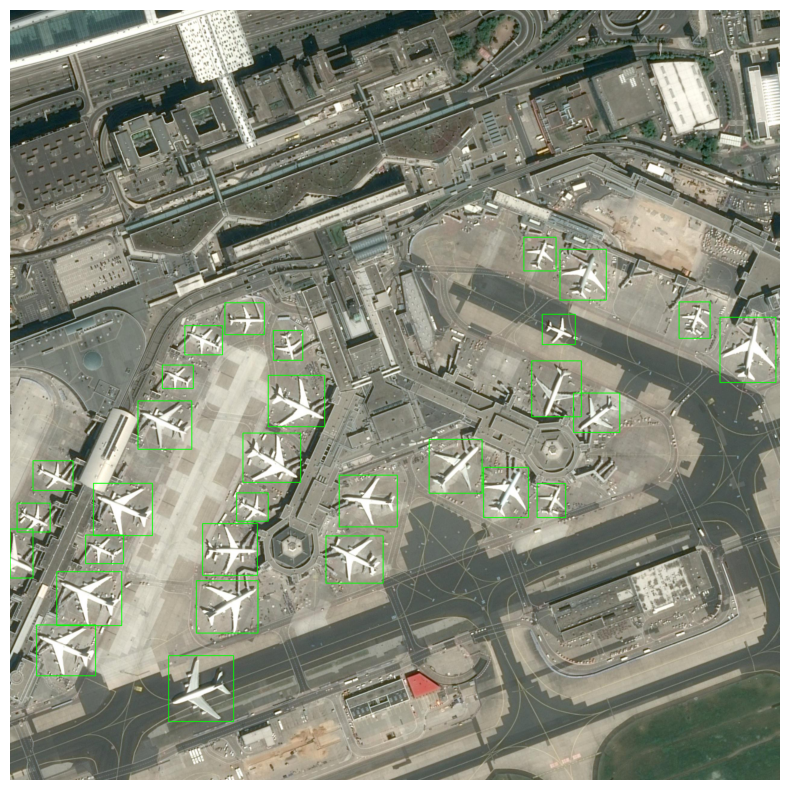

In [28]:
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
plt.axis('off')
plt.show()

#### Display Images with Bounding Boxes using .txt Files

In [29]:
def draw_bounding_boxes_on_tile(tile_path, label_path):
    img = cv2.imread(tile_path)
    image_height, image_width, _ = img.shape
    
    with open(label_path, 'r') as f:
        for line in f.readlines():
            class_id, x_center, y_center, width, height = map(float, line.split())
            # Convert normalized coordinates to pixel coordinates
            x_center, y_center, width, height = [x_center * image_width, y_center * image_height, width * image_width, height * image_height]
            x_min, y_min, x_max, y_max = int(x_center - width / 2), int(y_center - height / 2), int(x_center + width / 2), int(y_center + height / 2)
            
            cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
    
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [30]:
def display_image_tiles_in_matrix(original_image_name, tiles_dir, labels_dir, grid_size=(x_tiles, y_tiles)):
    fig, axs = plt.subplots(grid_size[0], grid_size[1], figsize=(20, 20))
    
    for i in range(grid_size[0]):
        for j in range(grid_size[1]):
            tile_name = f"{original_image_name}_tile_{i}_{j}.jpg"
            label_name = tile_name.replace('.jpg', '.txt')
            
            tile_path = os.path.join(tiles_dir, tile_name)
            label_path = os.path.join(labels_dir, label_name)
            
            if os.path.exists(tile_path) and os.path.exists(label_path):
                image_rgb = draw_bounding_boxes_on_tile(tile_path, label_path)
                axs[i, j].imshow(image_rgb)
            axs[i, j].axis('off')
    
    plt.tight_layout()
    plt.show()

In [31]:
def find_directory_with_image_labels(original_image_name, train_labels_dir, val_labels_dir):
    
    for label_file in os.listdir(train_labels_dir):
        if original_image_name in label_file:
            return train_labels_dir
            
    for label_file in os.listdir(val_labels_dir):
        if original_image_name in label_file:
            return val_labels_dir

In [32]:
original_image_name = random_image_name.replace('.jpg', '')
labels_dir = find_directory_with_image_labels(original_image_name, train_labels_dir, val_labels_dir)
tiles_dir = labels_dir.parent / 'images'

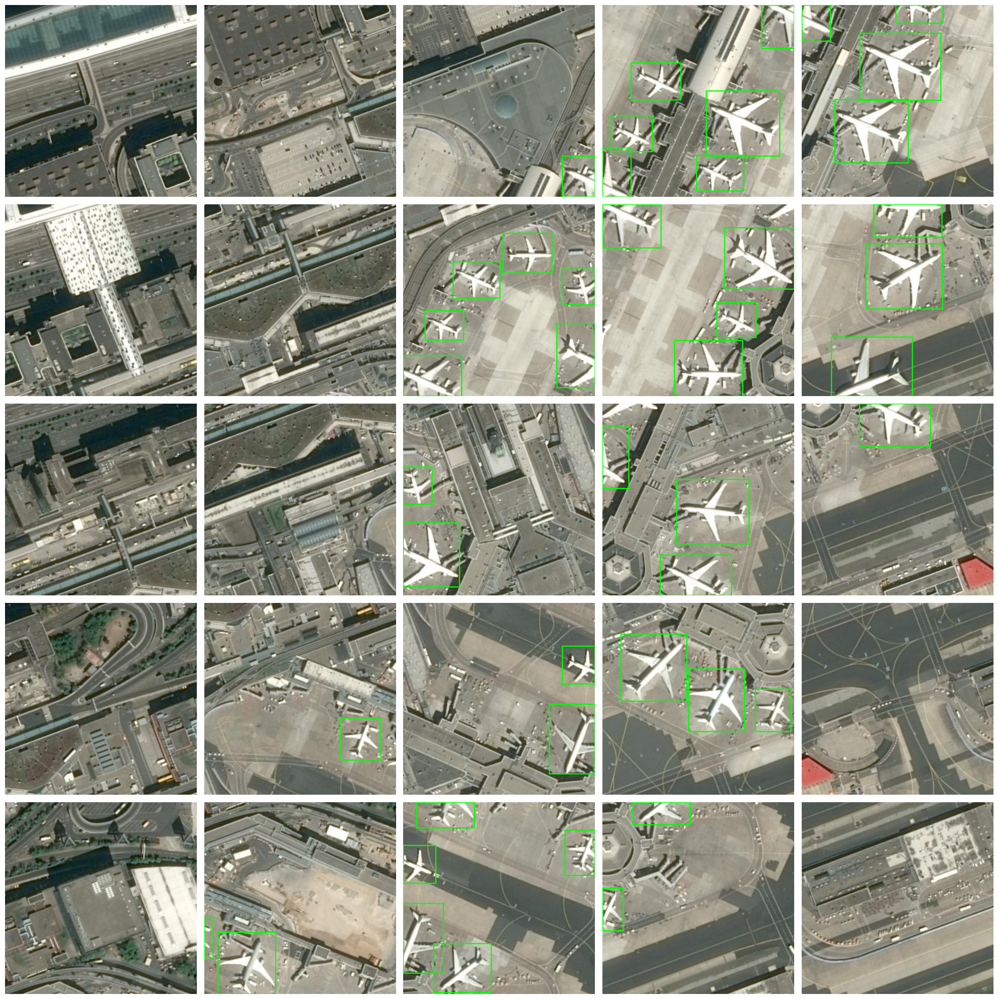

In [33]:
display_image_tiles_in_matrix(original_image_name, tiles_dir, labels_dir, grid_size=(5, 5))

## 3. Model Selection and Setup

### 3.1. Overview of YOLOv8

YOLOv8 is the latest in the series of YOLO (You Only Look Once) models, known for their efficiency and accuracy in real-time object detection. It is designed to be both faster and more accurate than its predecessors, making it suitable for a wide range of applications. YOLOv8 continues to be easy to use and deploy, with support for a wide range of computing devices.

### 3.2. Load Pre-Trained Model

In [34]:
model_name = "yolov8n"

In [35]:
model = YOLO(f"{model_name}.pt")

### 3.3. Set Dataset Configuration

In [36]:
data_yaml = """
train: ../../../data/processed/train
val: ../../../data/processed/val

nc: 2  # Number of classes
names: ['Airplane', 'Truncated_airplane']
"""

In [37]:
data_file_path = "dataset.yaml"
with open(data_file_path, "w") as f:
    f.write(data_yaml)

## 4. Model Training

### 4.1. Define Training Parameters

In [38]:
# Model parameters
epochs = 50        # Number of training epochs
batch_size = 16    # Batch size for training
image_size = 512   # Image size
device = '0'       # '0' for GPU (if available); use 'cpu' to force CPU training
workers = 0
cos_lr = True
mosaic = 0.0

### 4.2. Train the Model

In [39]:
# !nvidia-smi

In [40]:
results_train = model.train(
    data=data_file_path,
    epochs=epochs,
    batch=batch_size,
    imgsz=image_size,
    device=device,
    workers=workers,
    cos_lr=cos_lr,
    mosaic=mosaic,
)

New https://pypi.org/project/ultralytics/8.1.19 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.18 🚀 Python-3.9.10 torch-2.2.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=dataset.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=0, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, s

train: Scanning C:\Users\abirr\PycharmProjects\Airbus-Aircraft-Detection\data\processed\train\labels... 2952 images, 1414 backgrounds, 0 corrupt: 100%|██████████| 2952/2952 [00:01<0

train: WARNING ⚠️ C:\Users\abirr\PycharmProjects\Airbus-Aircraft-Detection\data\processed\train\images\7635d63c-6b97-4c9c-a7dc-27773d42ed4c_tile_4_1.jpg: 1 duplicate labels removed


train: New cache created: C:\Users\abirr\PycharmProjects\Airbus-Aircraft-Detection\data\processed\train\labels.cache


val: Scanning C:\Users\abirr\PycharmProjects\Airbus-Aircraft-Detection\data\processed\val\labels... 756 images, 351 backgrounds, 0 corrupt: 100%|██████████| 756/756 [00:00<00:00, 31


val: New cache created: C:\Users\abirr\PycharmProjects\Airbus-Aircraft-Detection\data\processed\val\labels.cache
Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to runs\detect\train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.55G      1.629      2.761      1.469          4        512: 100%|██████████| 185/185 [00:46<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:06<00:00,  3.69it/s]

                   all        756       1085       0.46      0.422      0.364      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.54G      1.611      2.052      1.509          2        512: 100%|██████████| 185/185 [00:43<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.16it/s]


                   all        756       1085      0.401      0.454      0.368      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.54G        1.6      1.669      1.506         12        512: 100%|██████████| 185/185 [00:44<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:06<00:00,  4.00it/s]


                   all        756       1085      0.487      0.504      0.453      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.52G      1.577      1.519       1.49          3        512: 100%|██████████| 185/185 [00:42<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.29it/s]

                   all        756       1085      0.557       0.48      0.446      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.53G      1.556      1.428      1.468          9        512: 100%|██████████| 185/185 [00:42<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.07it/s]


                   all        756       1085      0.517      0.548      0.472      0.275

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.53G      1.505      1.361      1.436         18        512: 100%|██████████| 185/185 [00:43<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.35it/s]

                   all        756       1085      0.596      0.464      0.454      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.53G      1.471      1.313      1.404         11        512: 100%|██████████| 185/185 [00:43<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.28it/s]

                   all        756       1085      0.506       0.48      0.445      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.52G      1.445      1.228      1.382          8        512: 100%|██████████| 185/185 [00:42<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.34it/s]

                   all        756       1085      0.603      0.602      0.572      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.54G      1.443      1.228       1.39         17        512: 100%|██████████| 185/185 [00:42<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.25it/s]

                   all        756       1085      0.574      0.587      0.536      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.53G       1.42      1.215      1.362          8        512: 100%|██████████| 185/185 [00:43<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.29it/s]

                   all        756       1085      0.501      0.493      0.443       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.54G       1.41      1.195      1.368          9        512: 100%|██████████| 185/185 [00:43<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.21it/s]

                   all        756       1085      0.594      0.544      0.508      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.52G      1.377      1.156      1.349          3        512: 100%|██████████| 185/185 [00:43<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.23it/s]

                   all        756       1085      0.533      0.599       0.51      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.53G      1.364      1.117      1.335         11        512: 100%|██████████| 185/185 [00:43<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.08it/s]

                   all        756       1085      0.631      0.604      0.571      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.53G      1.368      1.159      1.341         15        512: 100%|██████████| 185/185 [00:43<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.24it/s]

                   all        756       1085      0.614      0.588      0.537      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.53G      1.352      1.138      1.318          4        512: 100%|██████████| 185/185 [00:44<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.18it/s]

                   all        756       1085      0.627       0.64      0.578      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.52G      1.357        1.1      1.323          8        512: 100%|██████████| 185/185 [00:43<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.20it/s]

                   all        756       1085       0.63      0.601      0.561      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.53G      1.313      1.093      1.315         13        512: 100%|██████████| 185/185 [00:43<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.23it/s]

                   all        756       1085      0.645      0.622      0.583      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.53G      1.319      1.094      1.324         11        512: 100%|██████████| 185/185 [00:43<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.16it/s]

                   all        756       1085      0.601      0.629      0.572      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.53G      1.288      1.047      1.283         14        512: 100%|██████████| 185/185 [00:43<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.10it/s]

                   all        756       1085      0.641      0.587      0.571      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.52G      1.277      1.004      1.284         12        512: 100%|██████████| 185/185 [00:43<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.31it/s]

                   all        756       1085      0.624      0.584      0.552      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.54G      1.258     0.9982      1.273         15        512: 100%|██████████| 185/185 [00:43<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.21it/s]

                   all        756       1085      0.599      0.662      0.586      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.53G      1.234     0.9523      1.248         17        512: 100%|██████████| 185/185 [00:44<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.16it/s]

                   all        756       1085      0.701      0.616      0.613       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.53G      1.255      1.006      1.274          4        512: 100%|██████████| 185/185 [00:44<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.09it/s]

                   all        756       1085      0.664      0.672      0.632      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.52G      1.226     0.9396      1.245         12        512: 100%|██████████| 185/185 [00:44<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.17it/s]

                   all        756       1085      0.664      0.672      0.622      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.53G      1.212     0.9425      1.243          3        512: 100%|██████████| 185/185 [00:43<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.28it/s]

                   all        756       1085      0.656      0.638      0.624      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.53G      1.221     0.9122      1.237          9        512: 100%|██████████| 185/185 [00:42<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.30it/s]

                   all        756       1085      0.679      0.647      0.636      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.53G      1.188     0.9124      1.222          8        512: 100%|██████████| 185/185 [00:42<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.31it/s]

                   all        756       1085      0.688      0.644      0.615      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.52G      1.194     0.9136      1.224          4        512: 100%|██████████| 185/185 [00:42<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.38it/s]

                   all        756       1085      0.658      0.647      0.619      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.53G      1.178     0.8841      1.218          7        512: 100%|██████████| 185/185 [00:42<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.35it/s]

                   all        756       1085      0.694      0.657      0.662        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.53G       1.18     0.8665      1.221         12        512: 100%|██████████| 185/185 [00:42<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.37it/s]

                   all        756       1085      0.674      0.662       0.63      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.53G      1.153     0.8509      1.202         12        512: 100%|██████████| 185/185 [00:42<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.28it/s]

                   all        756       1085       0.69      0.665      0.631      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.52G      1.139     0.8395      1.192         21        512: 100%|██████████| 185/185 [00:42<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.34it/s]

                   all        756       1085      0.746      0.667      0.677      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.53G      1.134     0.8347      1.195          5        512: 100%|██████████| 185/185 [00:42<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.34it/s]

                   all        756       1085      0.712      0.669      0.654      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.53G      1.138     0.8163      1.187          3        512: 100%|██████████| 185/185 [00:42<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.35it/s]

                   all        756       1085      0.687      0.703      0.667       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.53G      1.117     0.7975       1.18         10        512: 100%|██████████| 185/185 [00:42<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.32it/s]

                   all        756       1085      0.742      0.677      0.671       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.52G      1.108     0.7726      1.171          8        512: 100%|██████████| 185/185 [00:42<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.35it/s]

                   all        756       1085      0.733      0.687      0.692      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.53G      1.101     0.7644      1.172         16        512: 100%|██████████| 185/185 [00:42<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.36it/s]

                   all        756       1085      0.728      0.676      0.684      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.53G      1.099      0.777      1.171          4        512: 100%|██████████| 185/185 [00:42<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.32it/s]

                   all        756       1085      0.728      0.695      0.695      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.53G      1.091     0.7754      1.173         10        512: 100%|██████████| 185/185 [00:42<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.32it/s]

                   all        756       1085      0.745      0.695      0.689      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.52G       1.08     0.7374      1.154         13        512: 100%|██████████| 185/185 [00:42<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.34it/s]

                   all        756       1085       0.75      0.673      0.696      0.435


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.53G      1.085     0.7514      1.166          8        512: 100%|██████████| 185/185 [00:42<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.30it/s]

                   all        756       1085      0.759      0.695      0.702      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.53G      1.063     0.7234      1.156         11        512: 100%|██████████| 185/185 [00:42<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.33it/s]

                   all        756       1085      0.748      0.713      0.709      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.53G      1.062     0.7182      1.149          9        512: 100%|██████████| 185/185 [00:42<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.36it/s]

                   all        756       1085      0.768      0.688        0.7      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.52G      1.047     0.6877      1.136         24        512: 100%|██████████| 185/185 [00:42<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.36it/s]

                   all        756       1085      0.736      0.715      0.713      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.53G      1.028     0.6864      1.131         11        512: 100%|██████████| 185/185 [00:42<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.33it/s]

                   all        756       1085      0.726      0.709      0.706      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.53G      1.051     0.7193      1.148         22        512: 100%|██████████| 185/185 [00:42<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.36it/s]

                   all        756       1085      0.767      0.683      0.709      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.53G      1.043     0.7001      1.138          8        512: 100%|██████████| 185/185 [00:42<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.38it/s]

                   all        756       1085      0.758      0.689      0.705       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.52G      1.031     0.6806      1.136         13        512: 100%|██████████| 185/185 [00:42<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.42it/s]

                   all        756       1085      0.757      0.692      0.707      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.53G      1.026     0.6861      1.132          7        512: 100%|██████████| 185/185 [00:43<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.32it/s]

                   all        756       1085      0.764      0.694      0.707      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.53G      1.031     0.6816      1.132          3        512: 100%|██████████| 185/185 [00:44<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:05<00:00,  4.16it/s]

                   all        756       1085      0.758      0.694      0.707      0.441



50 epochs completed in 0.685 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train\weights\best.pt, 6.2MB

Validating runs\detect\train\weights\best.pt...
Ultralytics YOLOv8.1.18 🚀 Python-3.9.10 torch-2.2.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:06<00:00,  3.80it/s]


                   all        756       1085      0.728      0.708      0.707      0.445
              Airplane        756        877      0.838      0.805      0.803      0.566
    Truncated_airplane        756        208      0.619      0.611       0.61      0.323
Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs\detect\train


In [41]:
results_train.results_dict

{'metrics/precision(B)': 0.7283783222660829,
 'metrics/recall(B)': 0.7078626897467617,
 'metrics/mAP50(B)': 0.7066079691906362,
 'metrics/mAP50-95(B)': 0.4447795382765416,
 'fitness': 0.4709623813679511}

### 4.3. Training Results

In [42]:
results_train_dir = results_train.save_dir

In [43]:
f1_image_path = f'{results_train_dir}/F1_curve.png'
p_image_path = f'{results_train_dir}/P_curve.png'
r_image_path = f'{results_train_dir}/R_curve.png'
pr_image_path = f'{results_train_dir}/PR_curve.png'

f1_img = mpimg.imread(f1_image_path)
p_img = mpimg.imread(p_image_path)
r_img = mpimg.imread(r_image_path)
pr_img = mpimg.imread(pr_image_path)

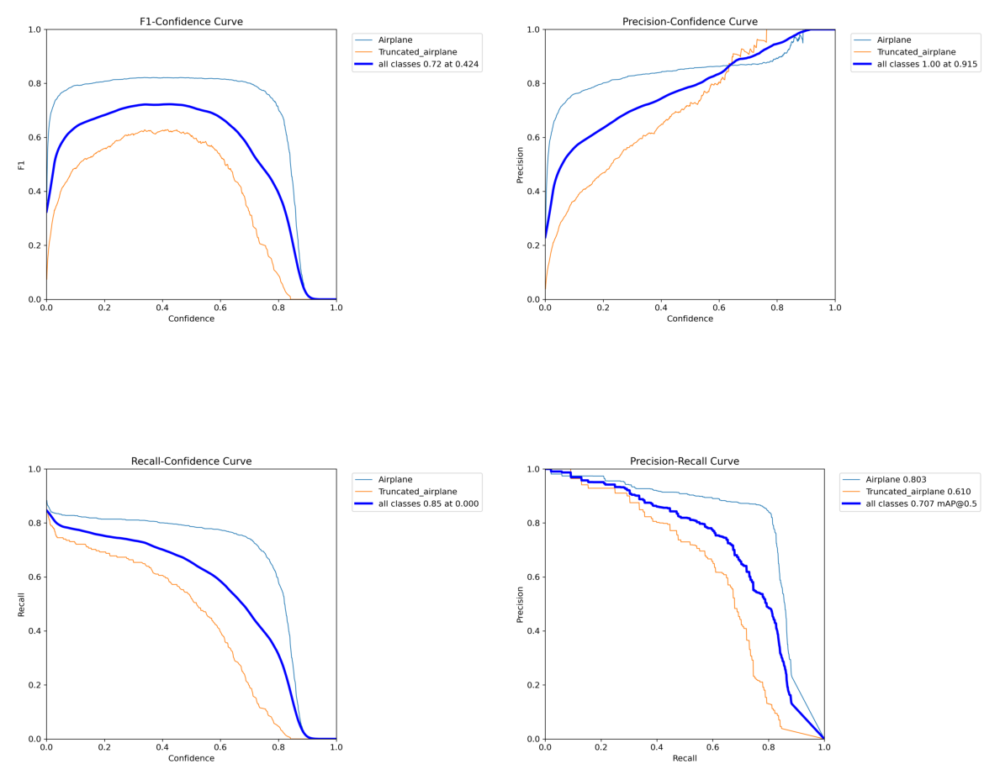

In [44]:
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

for ax in axs.flat:
    ax.axis('off')

axs[0, 0].imshow(f1_img)
axs[0, 1].imshow(p_img)
axs[1, 0].imshow(r_img)
axs[1, 1].imshow(pr_img)

plt.tight_layout()
plt.show()

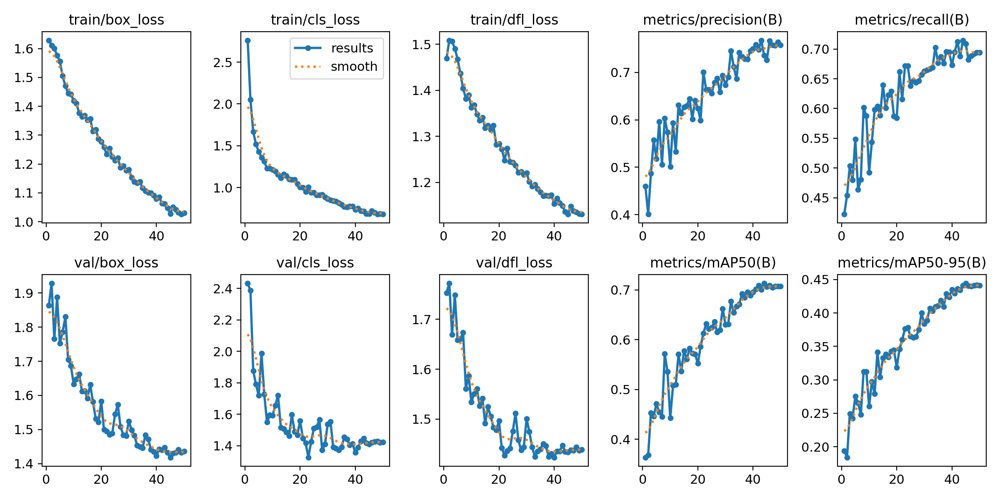

In [45]:
Image(filename=f'{results_train_dir}/results.png', width=1280)

## 5. Model Evaluation

### 5.1. Evaluate the Model

In [57]:
best_model = YOLO(results_train.save_dir / "weights/best.pt")

In [47]:
# results_val = best_model.val()

In [48]:
# results_val.results_dict

### 5.2. Validation Results

In [49]:
# results_val_dir = results_val.save_dir

In [50]:
# f1_image_path = f'{results_val_dir}/F1_curve.png'
# p_image_path = f'{results_val_dir}/P_curve.png'
# r_image_path = f'{results_val_dir}/R_curve.png'
# pr_image_path = f'{results_val_dir}/PR_curve.png'

# f1_img = mpimg.imread(f1_image_path)
# p_img = mpimg.imread(p_image_path)
# r_img = mpimg.imread(r_image_path)
# pr_img = mpimg.imread(pr_image_path)

In [51]:
# fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# for ax in axs.flat:
#     ax.axis('off')

# axs[0, 0].imshow(f1_img)
# axs[0, 1].imshow(p_img)
# axs[1, 0].imshow(r_img)
# axs[1, 1].imshow(pr_img)

# plt.tight_layout()
# plt.show()

## 6. Results Visualization

This section showcases the detection capabilities of the model through visualized results, emphasizing the precision in identifying and bounding target objects. 

### 6.1. Visualization of Detection Results

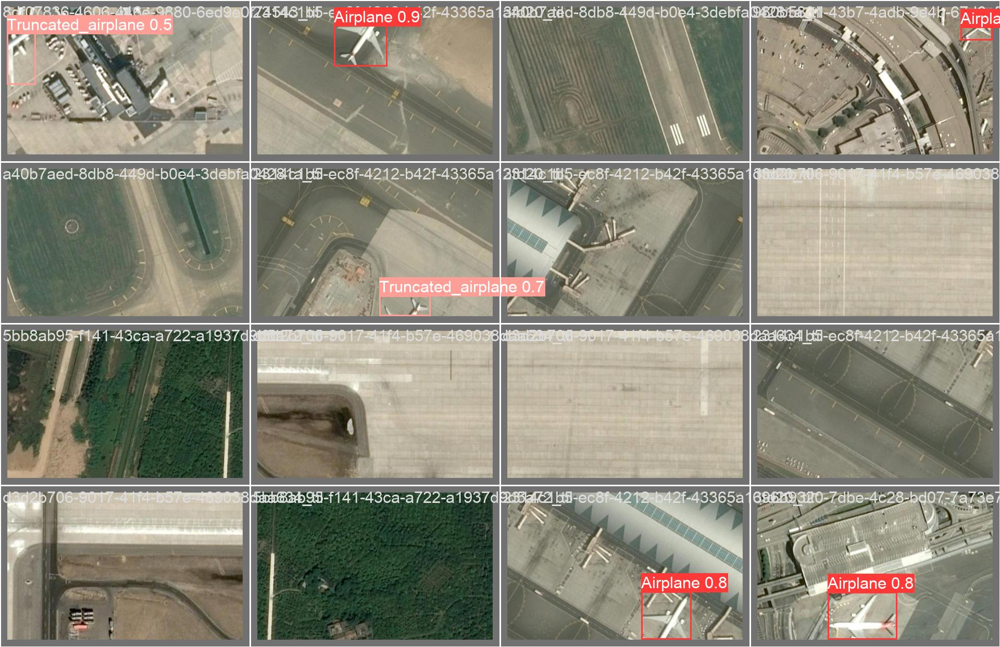

In [52]:
image_path = results_train_dir / "val_batch0_pred.jpg"
Image(filename=image_path, height=640)

### 6.2. Additional Visualizations

In [53]:
extras_df = pd.DataFrame({"image_id": os.listdir(raw_extras_dir)})

In [54]:
image_to_tiles(extras_df, raw_extras_dir, extras_images_dir, tile_size, overlap)

In [55]:
extras_predict_dir = Path("runs/detect/extras_predict")
extras_predict_dir.mkdir(parents=True, exist_ok=True)

In [58]:
results = best_model(extras_images_dir, verbose=False)

In [59]:
# Process results list
for i, result in enumerate(results):
    boxes = result.boxes
    # result.show()
    result.save(filename=extras_predict_dir / os.listdir(extras_images_dir)[i])

In [60]:
random_image_name = random.choice(os.listdir(extras_predict_dir))
original_image_name = random_image_name[:-13]
original_image_name

'65825eef-f8a1-41b3-ac87-4a0a7d482a0e'

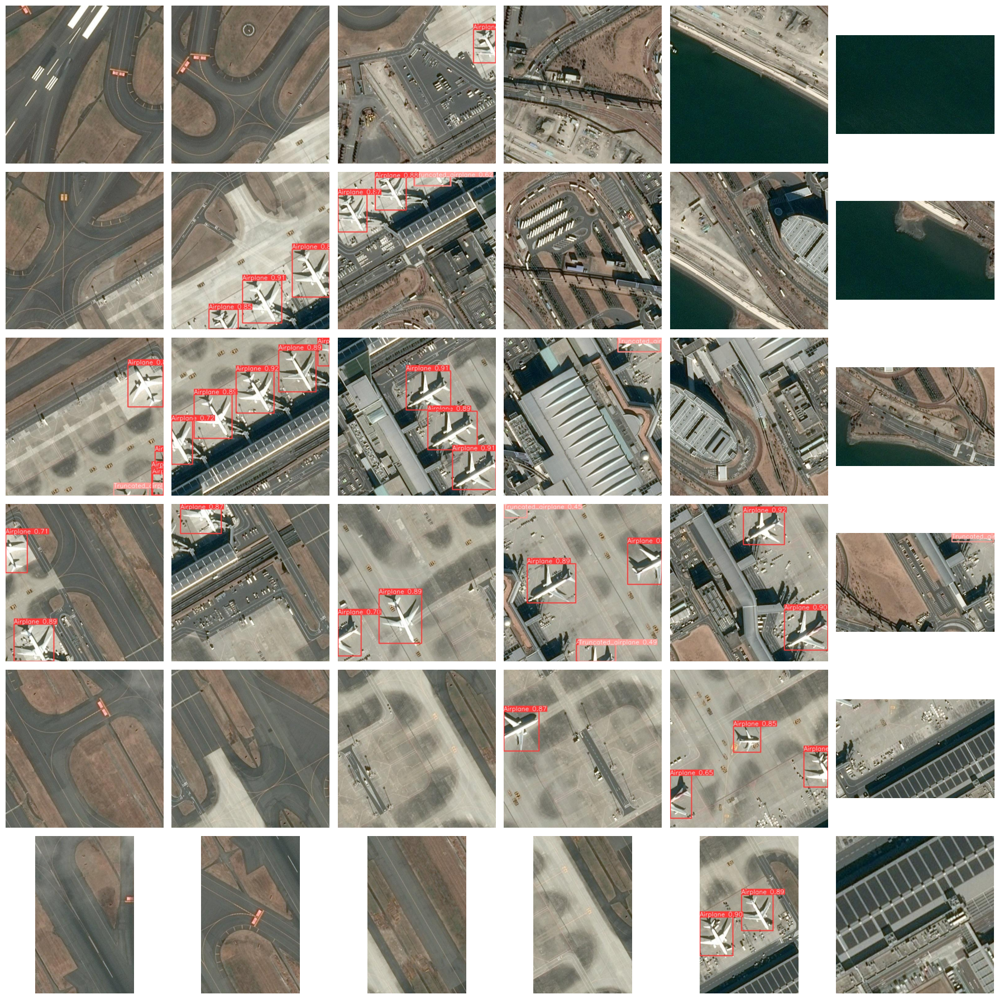

In [61]:
fig, axs = plt.subplots(y_tiles, x_tiles, figsize=(x_tiles*3, y_tiles*3))

# Loop through each position in the grid to display each tile
for y in range(y_tiles):
    for x in range(x_tiles):
        # Construct the filename for the current tile
        tile_name = f"{original_image_name}_tile_{y}_{x}.jpg"
        tile_path = os.path.join(extras_predict_dir, tile_name)
        
        # Load the tile
        tile = cv2.imread(tile_path)
        tile_rgb = cv2.cvtColor(tile, cv2.COLOR_BGR2RGB)  # Convert to RGB for displaying
        
        # Display the tile on the corresponding subplot
        axs[y, x].imshow(tile_rgb)
        axs[y, x].axis('off')  # Hide axis for each subplot

plt.tight_layout()
plt.show()

## 7. Conclusion

### 7.1. Summary of Findings

In undertaking this project, the focus was on training a YOLOv8 model for aircraft detection in satellite images. This initiative was not just about achieving high accuracy but also exploring the intersection of Earth Observation (EO) imagery with cutting-edge Deep Learning techniques. The Ultralytics YOLOv8 architecture, chosen for its blend of efficiency and precision in object detection tasks, served as the foundation for this exploration.

Throughout the project, careful dataset preparation and a structured approach to training and evaluation provided valuable insights:

- The model's precision rate of approximately 72.8% and recall of about 70.8% indicate a balanced performance in identifying actual aircraft within the images.
- Achieving a mean Average Precision (mAP) at an IoU threshold of 50% around 70.7% highlights the model's adeptness at maintaining a good balance between precision and recall under moderate detection criteria.
- The broader range mAP (50%-95%) at 44.5% reveals the model's varying performance across stricter detection criteria, showcasing areas where the detection process could be refined.
- The fitness score, indicative of the model's overall performance, stood at 0.471, reflecting a solid foundation with room for improvement.

These findings reflect the model's capability to serve as a valuable tool in the realm of EO imagery analysis for aircraft detection. The project emphasizes learning and experimentation within the fascinating domain of satellite imagery analysis and AI.

### 7.2. Recommendations for Model Improvement

Given the project's exploratory nature, aimed at delving into EO imagery and Deep Learning, the focus on improvements remains guided by the spirit of learning and experimentation. Here are thoughtful, yet explorative directions for enhancement:

- Explorative Data Augmentation: Introducing varied data augmentation techniques to simulate different imaging conditions could enrich the model's exposure to diverse scenarios, fostering a deeper understanding of its adaptability.

- Selective Hyperparameter Exploration: Playing with hyperparameters within a scope that encourages learning about their effects on model training and performance could yield instructive insights, rather than just optimizing for performance.

- Experimentation with Architectures: Trying out different YOLO configurations or other detection models could offer practical lessons on the trade-offs between complexity, performance, and speed in real-world applications.

- Dataset Diversification for Learning: Expanding the dataset with an eye on learning about the model's responsiveness to different aircraft types, sizes, and surroundings could offer a richer understanding of EO imagery's nuances.

- Contextual Insights for Enriched Learning: Incorporating contextual layers, such as geographical or environmental metadata, could provide a multidimensional learning experience, revealing how auxiliary information can influence detection accuracy.

This project, with its modestly sized dataset, was primarily a platform for exploration and learning in the vibrant fields of EO imagery and Deep Learning. The recommendations aim to nurture this exploratory journey, encouraging deeper inquiry and understanding rather than solely focusing on achieving the highest possible metrics.